<a href="https://colab.research.google.com/github/shubham19nijwala/PixelAugment-Image_Classification_with_Keras_TensorFlow_and_Data_Augmentation/blob/main/Cats_vs_Dogs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# *Downloaded Cats and Dogs Dataset*

In [ ]:
!wget https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip

--2023-08-06 15:10:20--  https://download.microsoft.com/download/3/E/1/3E1C3F21-ECDB-4869-8368-6DEBA77B919F/kagglecatsanddogs_5340.zip
Resolving download.microsoft.com (download.microsoft.com)... 23.46.200.228, 2600:141b:e800:1488::317f, 2600:141b:e800:1483::317f
Connecting to download.microsoft.com (download.microsoft.com)|23.46.200.228|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 824887076 (787M) [application/octet-stream]
Saving to: ‘kagglecatsanddogs_5340.zip.1’

kagglecatsanddogs_5 100%[===================>] 786.67M  48.9MB/s    in 13s     

2023-08-06 15:10:33 (60.9 MB/s) - ‘kagglecatsanddogs_5340.zip.1’ saved [824887076/824887076]



# *Unzipping Dataset*

In [ ]:
!unzip kagglecatsanddogs_5340.zip

Streaming output truncated to the last 5000 lines.
  inflating: PetImages/Dog/5500.jpg  
  inflating: PetImages/Dog/5501.jpg  
  inflating: PetImages/Dog/5502.jpg  
  inflating: PetImages/Dog/5503.jpg  
  inflating: PetImages/Dog/5504.jpg  
  inflating: PetImages/Dog/5505.jpg  
  inflating: PetImages/Dog/5506.jpg  
  inflating: PetImages/Dog/5507.jpg  
  inflating: PetImages/Dog/5508.jpg  
  inflating: PetImages/Dog/5509.jpg  
  inflating: PetImages/Dog/551.jpg   
  inflating: PetImages/Dog/5510.jpg  
  inflating: PetImages/Dog/5511.jpg  
  inflating: PetImages/Dog/5512.jpg  
  inflating: PetImages/Dog/5513.jpg  
  inflating: PetImages/Dog/5514.jpg  
  inflating: PetImages/Dog/5515.jpg  
  inflating: PetImages/Dog/5516.jpg  
  inflating: PetImages/Dog/5517.jpg  
  inflating: PetImages/Dog/5518.jpg  
  inflating: PetImages/Dog/5519.jpg  
  inflating: PetImages/Dog/552.jpg   
  inflating: PetImages/Dog/5520.jpg  
  inflating: PetImages/Dog/5521.jpg  
  inflating: PetImages/Dog/5522.jpg  

# *Importing Libraries*

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(color_codes=True)
import warnings
import os
import tqdm
import random
from tensorflow.keras.preprocessing.image import load_img
warnings.filterwarnings('ignore')

# *Creating DataFrame*

In [ ]:
input_path = [ ]
label = []

for class_name in os.listdir("PetImages"):
  for path in os.listdir("PetImages/"+class_name):
    if class_name == 'Cat':
      label.append(0)
    else:
      label.append(1)
    input_path.append(os.path.join("PetImages",class_name,path))


In [ ]:
print(input_path[0],label[0])

PetImages/Dog/6075.jpg 1


In [ ]:
df =pd.DataFrame()
df['Images'] = input_path
df['label'] = label
df.head()

,Images,label
0,PetImages/Dog/6075.jpg,1
1,PetImages/Dog/5220.jpg,1
2,PetImages/Dog/10650.jpg,1
3,PetImages/Dog/8683.jpg,1
4,PetImages/Dog/8037.jpg,1


In [ ]:
# Shuffling Data
df = df.sample(frac=1).reset_index(drop = True)
df

,Images,label
0,PetImages/Cat/219.jpg,0
1,PetImages/Cat/8800.jpg,0
2,PetImages/Dog/10395.jpg,1
3,PetImages/Cat/10225.jpg,0
4,PetImages/Dog/9934.jpg,1
...,...,...
24997,PetImages/Dog/8442.jpg,1
24998,PetImages/Cat/575.jpg,0
24999,PetImages/Dog/3230.jpg,1
25000,PetImages/Dog/10195.jpg,1


In [ ]:
df = df[df['Images'].str.contains('.jpg')]

In [ ]:
import PIL
l = []
for image in df['Images']:
    try:
        img = PIL.Image.open(image)
    except:
        l.append(image)
l

['PetImages/Cat/666.jpg', 'PetImages/Dog/11702.jpg']

In [ ]:
df = df[df['Images']!='PetImages/Cat/666.jpg']
df = df[df['Images']!='PetImages/Dog/11702.jpg']

In [ ]:
df.shape

(24998, 2)

# *Exploratory Data Analysis*

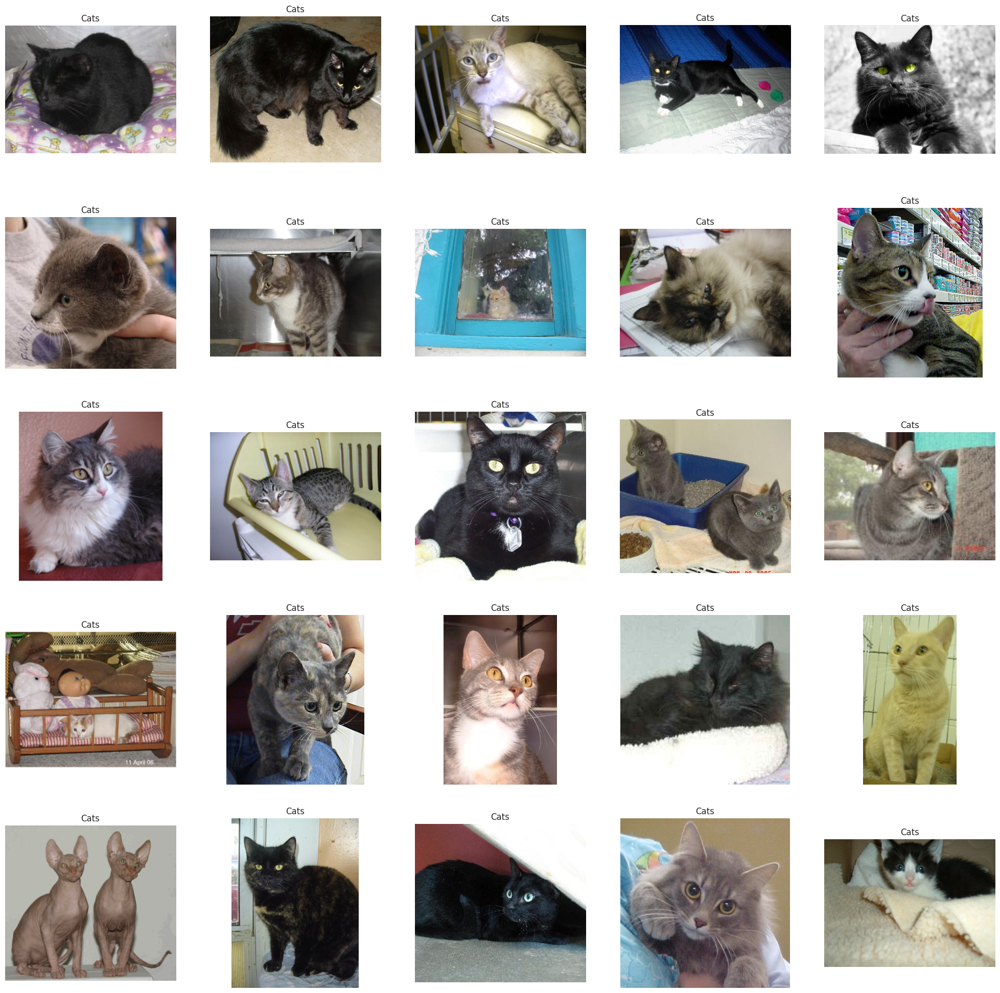

In [ ]:
# Cats Images
# to display grid of images
plt.figure(figsize=(25,25))
cats = df[df['label']==0]['Images']
start = random.randint(0, len(cats))
files = cats[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Cats')
    plt.axis('off')

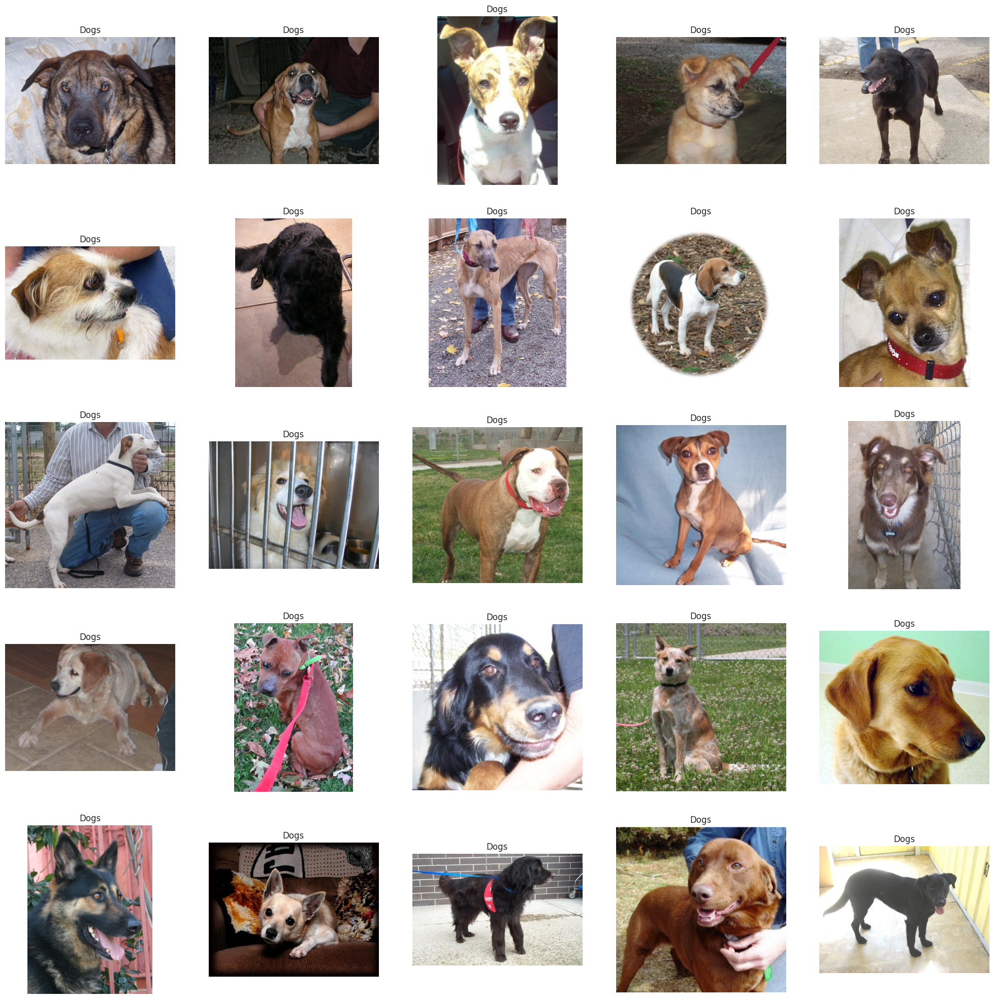

In [ ]:
# Dogs Images
# to display grid of images
plt.figure(figsize=(25,25))
dogs = df[df['label']==1]['Images']
start = random.randint(0, len(dogs))
files = dogs[start:start+25]

for index, file in enumerate(files):
    plt.subplot(5,5, index+1)
    img = load_img(file)
    img = np.array(img)
    plt.imshow(img)
    plt.title('Dogs')
    plt.axis('off')

<Axes: xlabel='label', ylabel='count'>

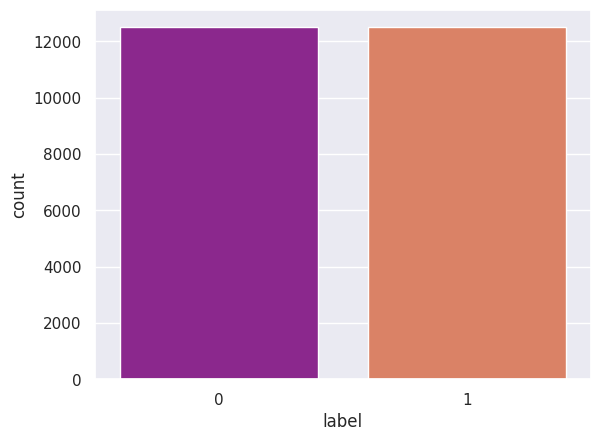

In [ ]:
sns.countplot(x='label',data=df,palette='plasma')

In [ ]:
df['label'] = df['label'].astype('str')
df.head()

,Images,label
0,PetImages/Cat/219.jpg,0
1,PetImages/Cat/8800.jpg,0
2,PetImages/Dog/10395.jpg,1
3,PetImages/Cat/10225.jpg,0
4,PetImages/Dog/9934.jpg,1


# *Train-Test Split*

In [ ]:
from sklearn.model_selection import train_test_split
train, test = train_test_split(df, test_size=0.2, random_state=19)

In [ ]:
train.head()

,Images,label
6320,PetImages/Dog/8781.jpg,1
5899,PetImages/Dog/11298.jpg,1
20871,PetImages/Dog/9562.jpg,1
11758,PetImages/Cat/3739.jpg,0
12061,PetImages/Dog/8886.jpg,1


In [ ]:
test.head()

,Images,label
20354,PetImages/Cat/11309.jpg,0
23832,PetImages/Cat/1267.jpg,0
5717,PetImages/Cat/12001.jpg,0
8246,PetImages/Dog/6238.jpg,1
13818,PetImages/Dog/1906.jpg,1


In [ ]:
print(f'Train Shape : {train.shape}')
print(f'Test Shape : {test.shape}')

Train Shape : (19998, 2)
Test Shape : (5000, 2)


In [ ]:
# Ways to reduce Overfitting :

# Add more data
# Data Augmentation
# L1/L2 Regularizer
# Dropout
# Batch Norm
# Reduce complexity

# *Creating DataGenerator for Images*

In [ ]:
# Generators:
'''When we have large amount of data instead of working on whole data altogether we create small batches
of data and loaded  it to RAM in a sequential manner in a way that if one batch work got completed next batch loaded
on to RAM to get its work done.
Therefore, Generators are very useful for processing large amount of data'''

'When we have large amount of data instead of working on whole data altogether we create small batches\nof data and loaded  it to RAM in a sequential manner in a way that if one batch work got completed next batch loaded\non to RAM to get its work done.\nTherefore, Generators are very useful for processing large amount of data'

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
# augmentation of Images to avoid Overfitting
train_generator = ImageDataGenerator(
                                              rescale =  1./255,   # normalization of images
                                              rotation_range = 30,
                                              shear_range = 0.2, #angle of the slant in degrees.
                                              zoom_range =0.2,
                                              horizontal_flip = True,
                                              fill_mode = 'nearest'
)
val_generator = ImageDataGenerator(rescale = 1./255)

train_iterator = train_generator.flow_from_dataframe(
    train,
    x_col='Images',
    y_col='label',
    target_size=(256,256),
    batch_size=32,
    class_mode='binary'
)

val_iterator = val_generator.flow_from_dataframe(
    test,
    x_col='Images',
    y_col='label',
    target_size=(256,256),
    batch_size=32,
    class_mode='binary'
)

Found 19998 validated image filenames belonging to 2 classes.
Found 5000 validated image filenames belonging to 2 classes.


# *Model Building*

In [ ]:
from keras import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense,BatchNormalization,Dropout

In [ ]:
# Create CNN model

model = Sequential()

model.add(Conv2D(10,kernel_size=(3,3),padding='valid',activation='relu',input_shape=(256,256,3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2),strides=2,padding='valid'))

model.add(Conv2D(20,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2),strides=2,padding='valid'))

model.add(Conv2D(40,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2),strides=2,padding='valid'))

model.add(Conv2D(80,kernel_size=(3,3),padding='valid',activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size = (2,2),strides=2,padding='valid'))

model.add(Flatten())

model.add(Dense(80,activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(40,activation = 'relu'))
model.add(Dropout(0.1))
model.add(Dense(20,activation= 'relu'))
model.add(Dropout(0.1))
model.add(Dense(10,activation='relu'))
model.add(Dropout(0.1))
model.add(Dense(1,activation='sigmoid'))

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 10)      280       
                                                                 
 batch_normalization (BatchN  (None, 254, 254, 10)     40        
 ormalization)                                                   
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 10)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 20)      1820      
                                                                 
 batch_normalization_1 (Batc  (None, 125, 125, 20)     80        
 hNormalization)                                                 
                                                        

In [ ]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy'])

In [ ]:
history = model.fit(train_iterator, epochs=12, validation_data=val_iterator)

Epoch 1/12
625/625 [==============================] - 330s 498ms/step - loss: 0.6388 - accuracy: 0.6322 - val_loss: 0.6388 - val_accuracy: 0.5430
Epoch 2/12
625/625 [==============================] - 309s 494ms/step - loss: 0.5277 - accuracy: 0.7357 - val_loss: 0.4527 - val_accuracy: 0.7840
Epoch 3/12
625/625 [==============================] - 309s 494ms/step - loss: 0.4667 - accuracy: 0.7852 - val_loss: 0.4557 - val_accuracy: 0.7904
Epoch 4/12
625/625 [==============================] - 309s 494ms/step - loss: 0.4059 - accuracy: 0.8170 - val_loss: 0.3992 - val_accuracy: 0.8276
Epoch 5/12
625/625 [==============================] - 309s 494ms/step - loss: 0.3673 - accuracy: 0.8416 - val_loss: 0.4006 - val_accuracy: 0.8302
Epoch 6/12
625/625 [==============================] - 311s 498ms/step - loss: 0.3286 - accuracy: 0.8607 - val_loss: 0.2990 - val_accuracy: 0.8662
Epoch 7/12
625/625 [==============================] - 309s 495ms/step - loss: 0.2919 - accuracy: 0.8782 - val_loss: 0.2777 -

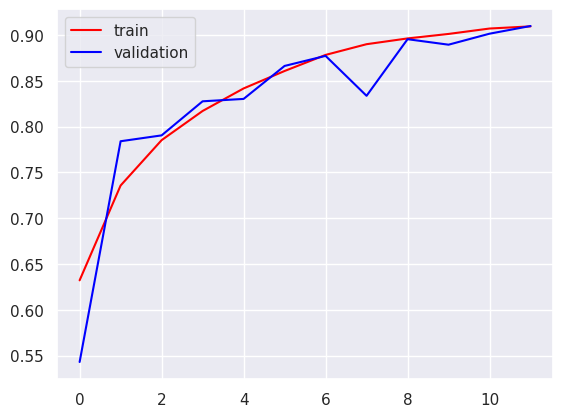

In [ ]:
# Accuracy
plt.plot(history.history['accuracy'],color='red',label='train')
plt.plot(history.history['val_accuracy'],color='blue',label='validation')
plt.legend()
plt.show()

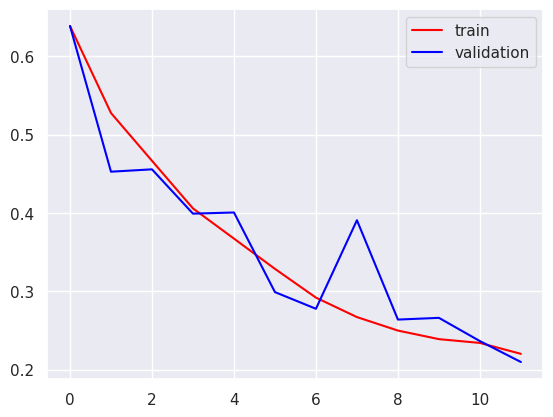

In [ ]:
# Loss
plt.plot(history.history['loss'],color='red',label='train')
plt.plot(history.history['val_loss'],color='blue',label='validation')
plt.legend()
plt.show()

# *Test With Real Image*

In [ ]:
import cv2

## *Cat Image*

In [ ]:
test_img = cv2.imread('/content/cat.jpg')

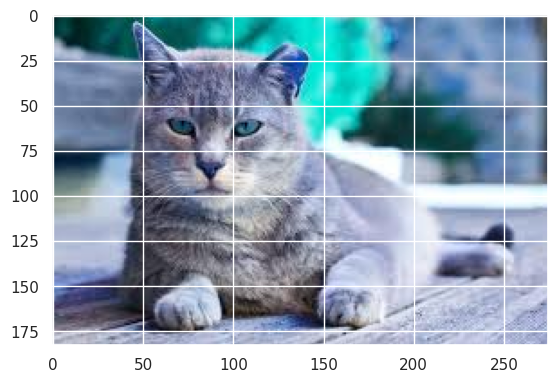

In [ ]:
plt.imshow(test_img)

In [ ]:
image_path = "/content/cat.jpg" # path of the image
img = load_img(image_path, target_size=(256,256))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1,256,256, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 289ms/step
Cat


## *Dog Image*

In [ ]:
test_img = cv2.imread('/content/dog.jpg')

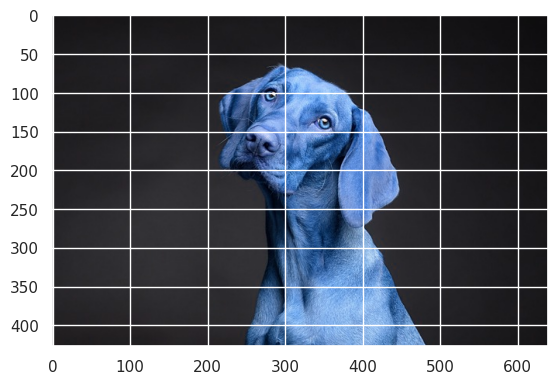

In [ ]:
plt.imshow(test_img)

In [ ]:
image_path = "/content/dog.jpg" # path of the image
img = load_img(image_path, target_size=(256,256))
img = np.array(img)
img = img / 255.0 # normalize the image
img = img.reshape(1,256,256, 3) # reshape for prediction
pred = model.predict(img)
if pred[0] > 0.5:
    label = 'Dog'
else:
    label = 'Cat'
print(label)

1/1 [==============================] - 0s 20ms/step
Dog


# *CONCLUSION*

## **STEPS PERFORMED**

---



1. **Dataset Preparation:** The Cats and Dogs dataset was downloaded and successfully unzipped to obtain the required image samples for the classification task.

2. **Data Preprocessing**: Essential libraries were imported to facilitate data manipulation and deep learning tasks.

3. **Exploratory Data Analysis (EDA):** Exploratory Data Analysis was performed to gain insights into the dataset, understand class distributions, and identify potential challenges.

4. **Data Split:** The dataset was split into training and testing sets to evaluate the model's performance on unseen data.

5. **Data Augmentation:** Data augmentation techniques were employed to enhance the training dataset by applying various transformations, leading to increased diversity and improved model generalization.

6. **Model Architecture:** A Convolutional Neural Network (CNN) model was designed, incorporating essential layers such as Maxpooling, Batch Normalization, and Dropout, to build an effective image classifier.

7. **Model Training:** The CNN model was trained using the augmented training data to learn relevant features and optimize the classification task.

8. **Model Evaluation:** The final model achieved promising results, demonstrating  an accuracy of 0.9094 and a loss of 0.2201  on the **training set** and a validation accuracy of 0.9098 and a validation loss of 0.2097   on the **validation set**.

9. **Real-World Testing**: The model was put to the test with real images, showcasing its ability to classify cats and dogs accurately.


In conclusion, the "PixelAugment" project successfully utilized Keras and TensorFlow for image classification. By applying data augmentation techniques, the model demonstrated improved performance and robustness, achieving an impressive accuracy of 90.94% on the training set and 90.98% on the validation set. These results indicate the effectiveness of the CNN architecture and data augmentation in building an accurate classifier for differentiating between cats and dogs. The project's success in classifying real-world images further reinforces the model's capability and practical applicability. Overall, "PixelAugment" presents a comprehensive and efficient approach to image classification using deep learning techniques.